# Virtual CT Pediatric Dataset
Brandon J Nelson brandon.nelson@fda.gov
2023-08-25

This notebook introduces how to generate a dataset ready for machine learning applications using the outputs of the XCIST CT simulations made with [XCIST](xcist_sims.py), see also [this shell script for running simulations in parallel on Betsy](submit_all_renders.sh).

This notebook introduces the pediatric XCAT scans and their associated meta data and how that can be used to a dataset with different patient, lesion, and scan acquisition parameters.

In [1]:
from pathlib import Path
import pandas as pd
import numpy as np
import random
from matplotlib import pyplot as plt

%matplotlib inline

In [2]:
!ls /projects01/didsr-aiml/brandon.nelson/XCAT_body/

abdomens_w_act			sample_dataset
peds_abdomens_08-25-2023_00-10	segmentation_dataset


In [3]:
dirP = list(Path('/projects01/didsr-aiml/brandon.nelson/XCAT_body').glob('peds_abdomens_*'))[-1]
dirP

PosixPath('/projects01/didsr-aiml/brandon.nelson/XCAT_body/peds_abdomens_08-25-2023_00-10')

## Accessing Simulations and Metadata

 A summary of key simulation parameters including virtual patient data, scan acquisition, and recon details are saved as outputs from the `xcist` simulations, when running in parallel, these are all saved as `<SGE_TASK_ID>_summary.csv`, these can all be concatenated together as shown below (if commented out, then this has already been done.

In [4]:
def lesion_present(lesion_name): return Path(str(lesion_name)).exists()

csv_file = dirP/'summary.csv'
if csv_file.exists():
    summary = pd.read_csv(dirP/'summary.csv')
else:
    summary = pd.concat([pd.read_csv(f) for f in dirP.glob('*.csv')]).reset_index()
    summary['lesion present'] = list(map(lesion_present, summary.lesion_name))
    summary.to_csv(dirP/'summary.csv', index=False)
    summary.to_csv(csv_file, index=False)
summary.pop('simulation')
summary.pop('add_lesion')
summary

,Code #,age (month),age (year),gender,weight (kg),height (cm),BMI,weight percentile,height percentile,Notes,ethnicity,kVp,mA,slice,fov,lesion_name,results_name,lesion present
0,336,52,4.300,F,16.1,100.3,16.00000,41.0,13.7,Can be male or female,NaN,110,350,373,233.826503,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,False
1,Reference newborn,2,0.166,M,3.8,52.0,14.10000,36.0,NaN,NaN,NaN,120,300,3,137.206260,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,False
2,152,384,32.000,F,80.3,171.5,27.30155,77.6,90.5,NaN,white,120,350,53,415.248872,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,False
3,96,576,48.000,M,92.7,180.3,28.52000,71.3,52.0,NaN,white,110,50,35,445.142049,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,False
4,96,576,48.000,M,92.7,180.3,28.52000,71.3,52.0,NaN,white,110,150,143,447.412677,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12153,77,372,31.000,M,77.9,185.2,22.71000,49.1,13.0,NaN,asian,120,50,479,404.915431,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,False
12154,336,52,4.300,F,16.1,100.3,16.00000,41.0,13.7,Can be male or female,NaN,120,150,254,246.481573,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,True
12155,152,384,32.000,F,80.3,171.5,27.30155,77.6,90.5,NaN,white,120,350,70,414.184501,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,False
12156,Reference 1 yr old,12,1.000,F,10.3,77.0,17.40000,53.0,NaN,NaN,NaN,130,250,150,214.871019,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,False


Notes: some relevant columns are `add_lesion`, this indicates that the simulation *tried* to insert a lesion into the specified organ, this can fail if not enough of that organ is in the selected slice, if that is the case then the `lesion_name` entry (pointing to the lesion ground truth file) is NaN. 

Thus the best indicator of lesion present in an image is when there is a valid lesion ground truth image available under `lesion_name`

## TODOS

1. Will probably need to do an initial QC commissioning of these simulations with our Digital Image Quality phantoms to make sure that mA, kVp and other trends are as expected
2. These datasets take up a lot of disk space, especially the raw data, I should remove these *.scan, *.air files when done, all I need are the *.raw files, this will save lots of disk space (done)
3. most of the intermediate phantom files are also not needed and can be deleted, only need the ground truth image and lesion ground truth, the other "voxelized" outputs can be cleaned up

## Getting Simulation Results
Simulation results can be found under the `results_name` column, these point to the `.raw` CT recon image files saved out by the XCIST simulation

In [5]:
def load_volume(path, shape=(512, 512), dtype='float32'):
    input_image = np.fromfile(path, dtype=dtype)
    input_image = input_image.reshape(shape)
    return(input_image)

The small pediatric patients look chunky, stair step artifacts, because their matrix size is too small (1024), I need to make a rule to give them a 2048 matrix or use the NURBS surfaces as an input to XCIST

In [6]:
import numpy as np
from PIL import Image

def pil_grid(images, max_horiz=np.iinfo(int).max):
    n_images = len(images)
    n_horiz = min(n_images, max_horiz)
    h_sizes, v_sizes = [0] * n_horiz, [0] * (n_images // n_horiz)
    for i, im in enumerate(images):
        h, v = i % n_horiz, i // n_horiz
        h_sizes[h] = max(h_sizes[h], im.size[0])
        v_sizes[v] = max(v_sizes[v], im.size[1])
    h_sizes, v_sizes = np.cumsum([0] + h_sizes), np.cumsum([0] + v_sizes)
    im_grid = Image.new('RGB', (h_sizes[-1], v_sizes[-1]), color='white')
    for i, im in enumerate(images):
        im_grid.paste(im, (h_sizes[i % n_horiz], v_sizes[i // n_horiz]))
    return im_grid

In [7]:
def normalize(image): return 1 - (image.max() - image) / (image.max() - image.min())

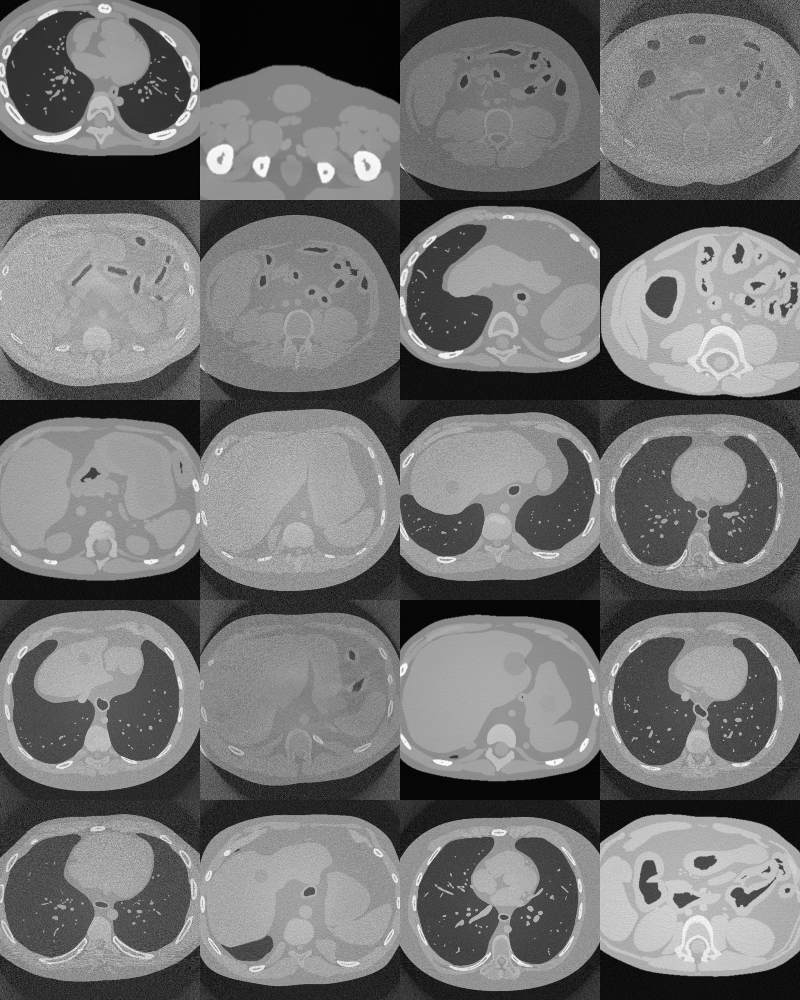

In [8]:
l_images = []
N = min(len(summary), 20)
for i in range(N):
    im_name = summary['results_name'].iloc[i]
    image = (normalize(load_volume(im_name))*255).astype('uint8')
    l_images.append(Image.fromarray(image))
pil_grid(l_images, 4)

## Looking at lesion present images

Using the image metadata dataframe you can also filter for images containing lesions using the `lesion_name` present trick discussed above

## Accessing ground truth phantoms

The summary dataframe also points to the location of the ground truth phantoms used to make the images

In [9]:
import pydicom
from scipy.ndimage import zoom
from scipy.ndimage import affine_transform
from mpl_toolkits.axes_grid1 import make_axes_locatable

from make_dataset import get_ground_truth, get_segmentation_mask, get_lesion_mask
    
def plot_patient_images(ct_image, ground_truth, seg_mask=None, lesion_mask=None):
    if lesion_mask is not None:
        f, axs = plt.subplots(2, 2, figsize=(6, 6), dpi=150)
        axs = axs.flatten()
    else:
        f, axs = plt.subplots(1, 3, figsize=(8, 4), dpi=150)
    axs[0].imshow(ct_image, cmap='gray')
    axs[0].set_title('CT image')
    axs[1].imshow(ground_truth, cmap='gray')
    axs[1].set_title('Phantom image')
    if seg_mask is not None:
        im = axs[2].imshow(seg_mask)
        axs[2].set_title('Segmentation mask')
        divider = make_axes_locatable(axs[2])
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)
    list(map(lambda ax: ax.set_axis_off(), axs))
    if lesion_mask is not None:
        axs[3].imshow(lesion_mask)
        axs[3].set_title('lesion mask')

Code #                                                             152
age (month)                                                        384
age (year)                                                        32.0
gender                                                               F
weight (kg)                                                       80.3
height (cm)                                                      171.5
BMI                                                           27.30155
weight percentile                                                 77.6
height percentile                                                 90.5
Notes                                                              NaN
ethnicity                                                        white
kVp                                                                130
mA                                                                 150
slice                                                              116
fov   

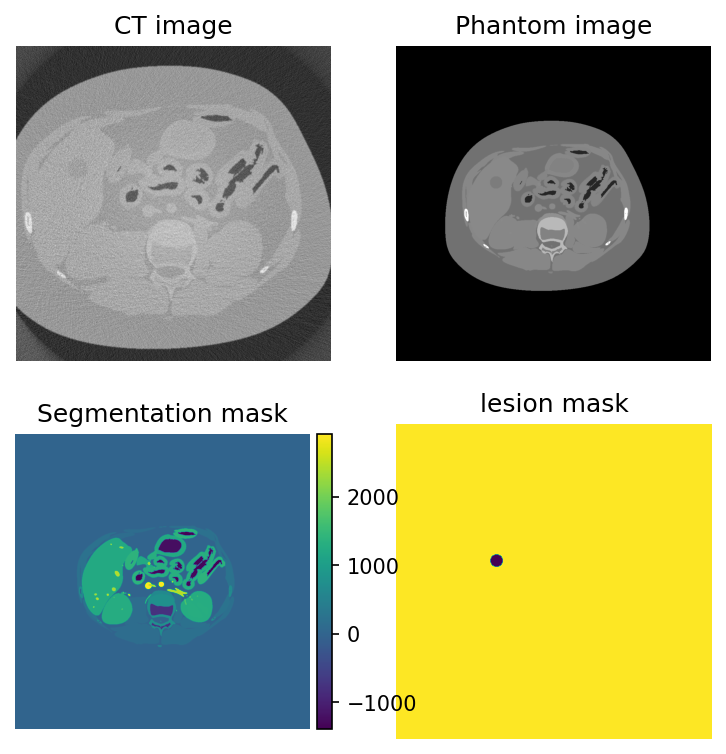

In [10]:
sample_patient = summary.iloc[800]
print(sample_patient)
ct_image = load_volume(sample_patient.results_name)
ground_truth = get_ground_truth(sample_patient)
seg_mask = get_segmentation_mask(sample_patient)
lesion_mask = get_lesion_mask(sample_patient)

plot_patient_images(ct_image, ground_truth, seg_mask, lesion_mask)
int_labels=np.unique(seg_mask)
print(f'This mask has [{len(int_labels)}] unique labels, they are:\n{int_labels}')

**However**, an issue arises when you want to associate the exact ground truth lesion location to that of the reconstructed image, because they are not in the same image location depending on how the patient is positioned and scan is taken (and they aren't the same resolution either)

In [11]:
lesions_df = summary[summary['lesion_name'].notna()]
patient = lesions_df.iloc[0]
im_name = patient.results_name
lesion_name = patient.lesion_name

image = load_volume(im_name, shape=(512,512))
gt = get_ground_truth(patient)
print(lesion_name)
gt_lesion = pydicom.read_file(lesion_name).pixel_array
gt_lesion.shape, gt.shape, image.shape

/projects01/didsr-aiml/brandon.nelson/XCAT_body/peds_abdomens_08-25-2023_00-10/phantoms/male_pt77/346/lesions/lesion_346.dcm


((1024, 1024), (1024, 1024), (512, 512))

For that reason we currently use image registration (not perfect!) to match the ground truth to the reconstructed image. An alternative approach would be to just reconstruct the lesion only image (not yet implemented)

In [12]:
from make_dataset import get_registration_transform, get_registered_ground_truths

Start by getting the transformation matrix going from object space to recon space using the reconstructed CT image as the moving image and the ground truth phantom as the reference image:

In [13]:
patient = summary.iloc[0]

ground_truth_image = get_ground_truth(patient)
ct_image = load_volume(patient.results_name, shape=(512, 512))
transform = get_registration_transform(ct_image, ground_truth_image)
transform

array([[7.00016062e-01, 1.76419893e-03, 3.34367348e+02],
       [6.46693240e-03, 6.93035171e-01, 3.34951483e+02],
       [1.02674410e-05, 4.41510801e-06, 1.00000000e+00]])

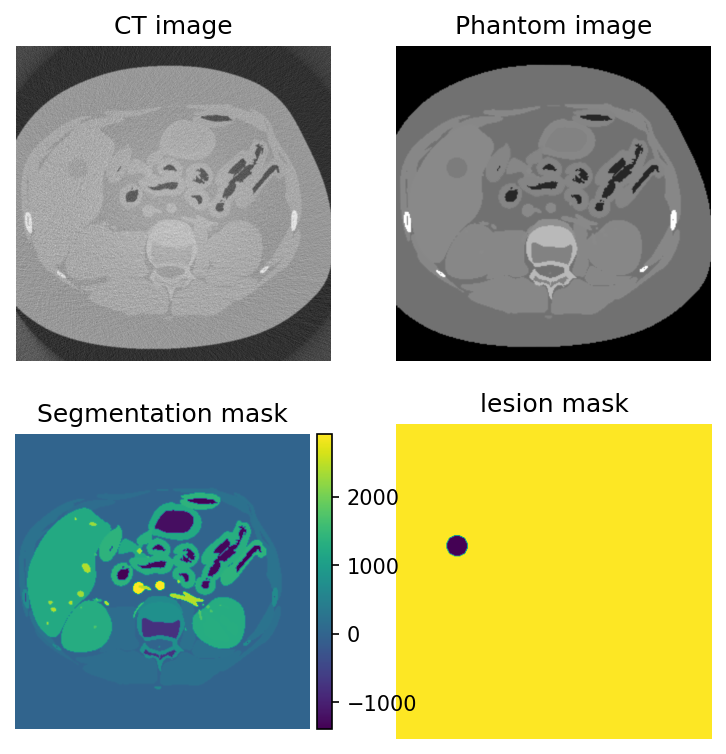

In [14]:
patient = summary.iloc[800]
ct_image, ground_truth_transformed, seg_mask_transformed, lesion_mask_transformed = get_registered_ground_truths(patient)
plot_patient_images(ct_image, ground_truth_transformed, seg_mask_transformed, lesion_mask_transformed)

Since sometimes the registration is of poor quality you can filtered them out using a simple rmse error term between the CT and ground truth for quality control

In [15]:
def norm(x,y):
    diff = x.ravel() - y.ravel()
    return np.sqrt(np.dot(diff, diff.T)/x.size)

Code #                                                             336
age (month)                                                         52
age (year)                                                         4.3
gender                                                               F
weight (kg)                                                       16.1
height (cm)                                                      100.3
BMI                                                               16.0
weight percentile                                                 41.0
height percentile                                                 13.7
Notes                                            Can be male or female
ethnicity                                                          NaN
kVp                                                                110
mA                                                                 350
slice                                                              373
fov   

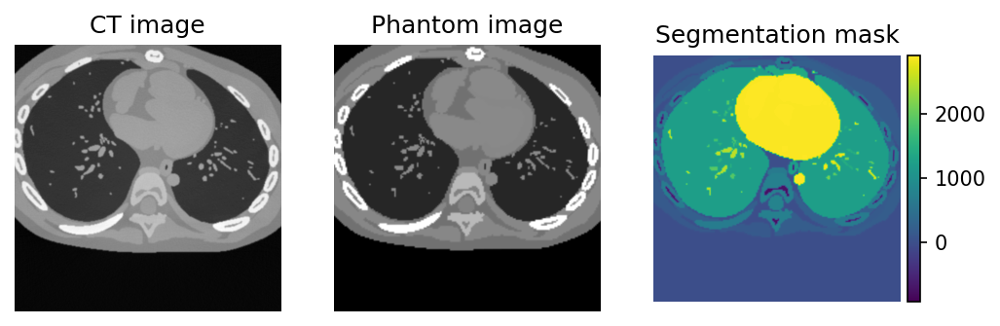

Code #                                                             152
age (month)                                                        384
age (year)                                                        32.0
gender                                                               F
weight (kg)                                                       80.3
height (cm)                                                      171.5
BMI                                                           27.30155
weight percentile                                                 77.6
height percentile                                                 90.5
Notes                                                              NaN
ethnicity                                                        white
kVp                                                                120
mA                                                                 350
slice                                                               53
fov   

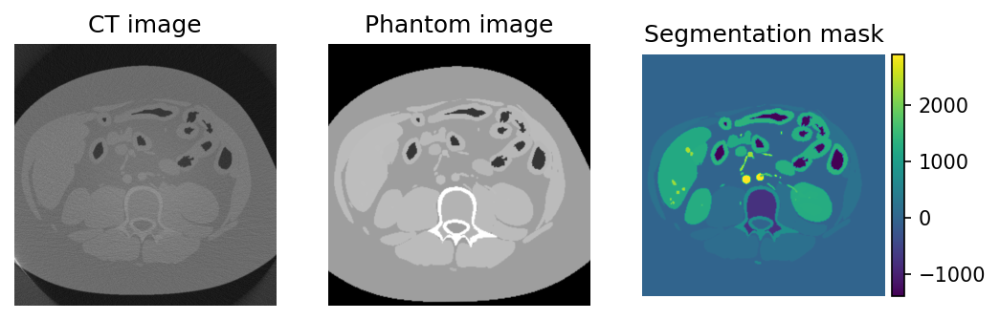

Code #                                                             152
age (month)                                                        384
age (year)                                                        32.0
gender                                                               F
weight (kg)                                                       80.3
height (cm)                                                      171.5
BMI                                                           27.30155
weight percentile                                                 77.6
height percentile                                                 90.5
Notes                                                              NaN
ethnicity                                                        white
kVp                                                                110
mA                                                                 300
slice                                                               77
fov   

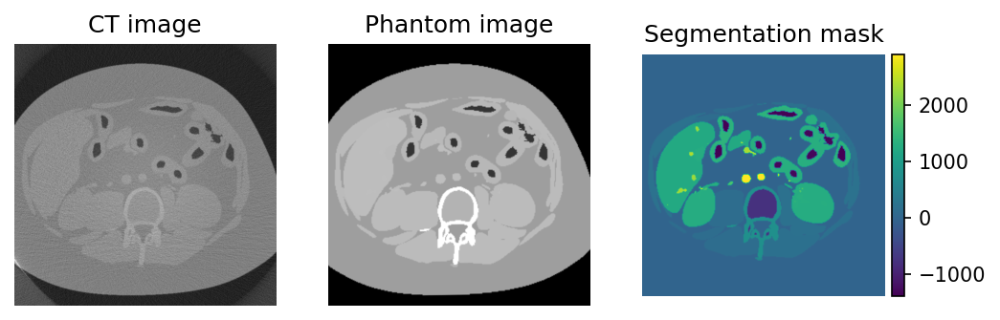

Code #                                              Reference 5 yr old
age (month)                                                         60
age (year)                                                         5.0
gender                                                               M
weight (kg)                                                       19.9
height (cm)                                                      110.0
BMI                                                               16.4
weight percentile                                                 50.0
height percentile                                                  NaN
Notes                                                              NaN
ethnicity                                                          NaN
kVp                                                                120
mA                                                                  50
slice                                                               41
fov   

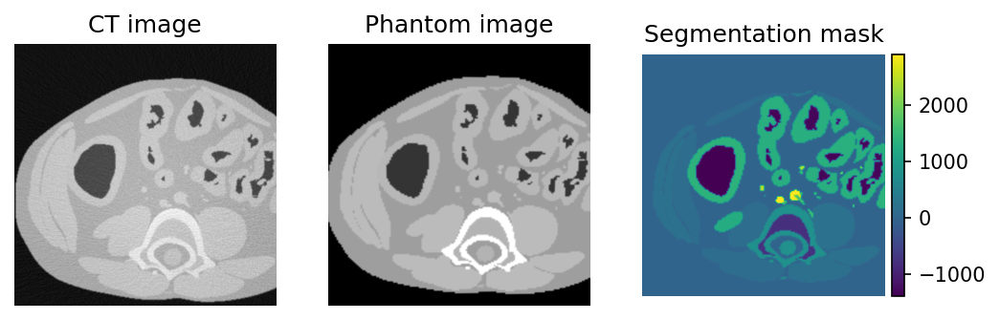

Code #                                                             152
age (month)                                                        384
age (year)                                                        32.0
gender                                                               F
weight (kg)                                                       80.3
height (cm)                                                      171.5
BMI                                                           27.30155
weight percentile                                                 77.6
height percentile                                                 90.5
Notes                                                              NaN
ethnicity                                                        white
kVp                                                                120
mA                                                                  50
slice                                                              433
fov   

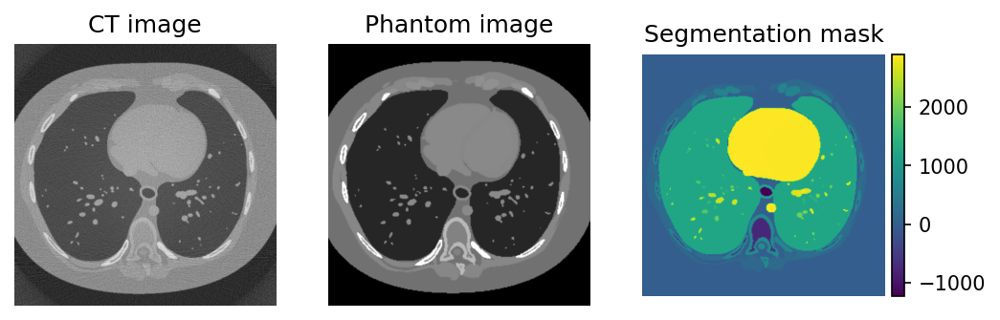

In [16]:
max_images = 5
count = 0
idx = 0
while count < max_images:
    patient = summary.iloc[idx]
    ct_image, ground_truth_transformed, seg_mask_transformed, lesion_mask_transformed = get_registered_ground_truths(patient)
    rmse = norm(ct_image, ground_truth_transformed)
    idx += 1
    if seg_mask_transformed is None:
        continue
    if rmse > 200:
        continue
    print(patient)
    print(f'{rmse:3.3f}')
    count += 1
    plot_patient_images(ct_image, ground_truth_transformed, seg_mask_transformed, lesion_mask_transformed)
    plt.show()

## Select only scans taken with a certain technique
An advantage of keeping all the meta data is that you can use it to fine tune your dataset based on patient, scan or lesion characteristics

In [17]:
summary['kVp'].unique()

array([110, 120, 130])

In [18]:
summary['mA'].unique()

array([350, 300,  50, 150, 200, 100, 250])

In [19]:
low_dose_ct_scans = summary[(summary['kVp']<120) & (summary['mA'] < 150)]
low_dose_ct_scans

,Code #,age (month),age (year),gender,weight (kg),height (cm),BMI,weight percentile,height percentile,Notes,ethnicity,kVp,mA,slice,fov,lesion_name,results_name,lesion present
3,96,576,48.000,M,92.7,180.3,28.52,71.3,52.0,NaN,white,110,50,35,445.142049,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,False
20,77,372,31.000,M,77.9,185.2,22.71,49.1,13.0,NaN,asian,110,100,390,396.167565,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,True
21,336,52,4.300,F,16.1,100.3,16.00,41.0,13.7,Can be male or female,NaN,110,50,312,241.684116,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,False
29,96,576,48.000,M,92.7,180.3,28.52,71.3,52.0,NaN,white,110,100,429,454.151016,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,False
48,Reference 1 yr old,12,1.000,F,10.3,77.0,17.40,53.0,NaN,NaN,NaN,110,100,164,218.032584,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12132,Reference newborn,2,0.166,M,3.8,52.0,14.10,36.0,NaN,NaN,NaN,110,100,146,142.048445,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,False
12135,336,52,4.300,F,16.1,100.3,16.00,41.0,13.7,Can be male or female,NaN,110,100,253,246.542744,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,False
12139,96,576,48.000,M,92.7,180.3,28.52,71.3,52.0,NaN,white,110,100,497,455.489250,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,False
12142,Reference newborn,2,0.166,M,3.8,52.0,14.10,36.0,NaN,NaN,NaN,110,100,335,150.550897,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,False


Code #                                                             336
age (month)                                                         52
age (year)                                                         4.3
gender                                                               F
weight (kg)                                                       16.1
height (cm)                                                      100.3
BMI                                                               16.0
weight percentile                                                 41.0
height percentile                                                 13.7
Notes                                            Can be male or female
ethnicity                                                          NaN
kVp                                                                110
mA                                                                  50
slice                                                              312
fov   

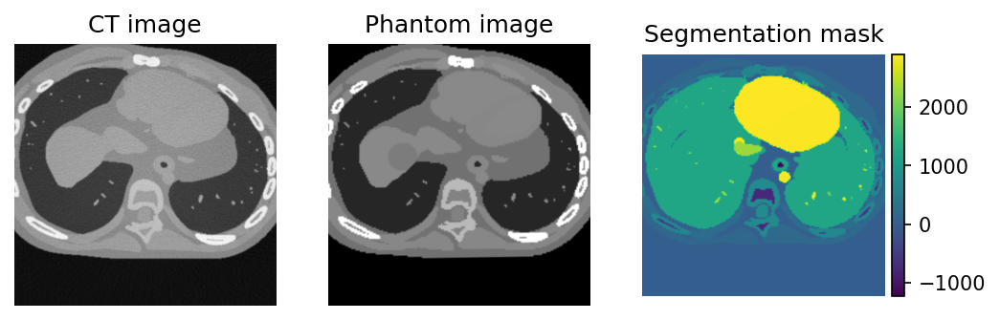

Code #                                                             336
age (month)                                                         52
age (year)                                                         4.3
gender                                                               F
weight (kg)                                                       16.1
height (cm)                                                      100.3
BMI                                                               16.0
weight percentile                                                 41.0
height percentile                                                 13.7
Notes                                            Can be male or female
ethnicity                                                          NaN
kVp                                                                110
mA                                                                  50
slice                                                              444
fov   

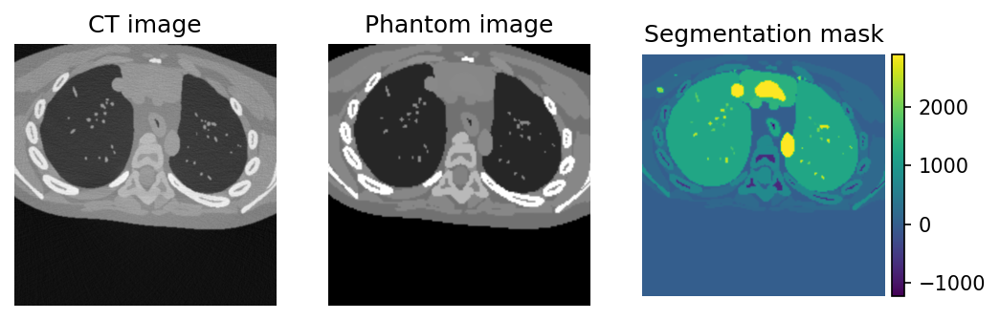

Code #                                              Reference 5 yr old
age (month)                                                         60
age (year)                                                         5.0
gender                                                               M
weight (kg)                                                       19.9
height (cm)                                                      110.0
BMI                                                               16.4
weight percentile                                                 50.0
height percentile                                                  NaN
Notes                                                              NaN
ethnicity                                                          NaN
kVp                                                                110
mA                                                                 100
slice                                                              491
fov   

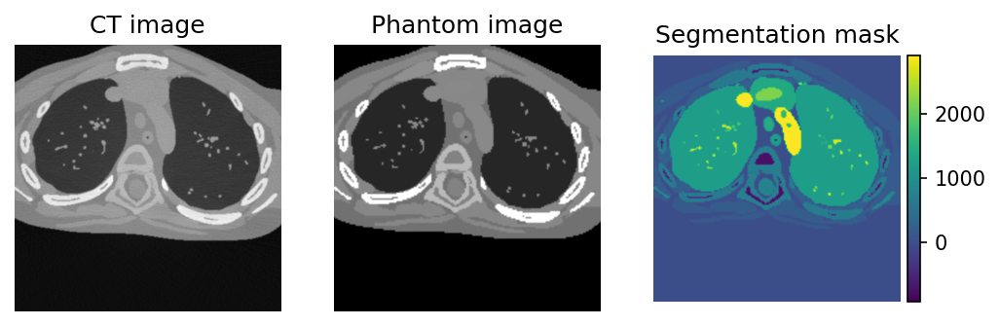

Code #                                              Reference 5 yr old
age (month)                                                         60
age (year)                                                         5.0
gender                                                               M
weight (kg)                                                       19.9
height (cm)                                                      110.0
BMI                                                               16.4
weight percentile                                                 50.0
height percentile                                                  NaN
Notes                                                              NaN
ethnicity                                                          NaN
kVp                                                                110
mA                                                                 100
slice                                                               42
fov   

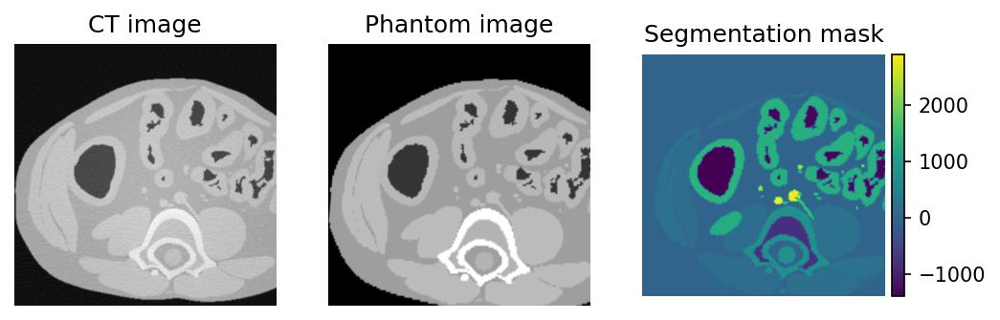

Code #                                                             336
age (month)                                                         52
age (year)                                                         4.3
gender                                                               F
weight (kg)                                                       16.1
height (cm)                                                      100.3
BMI                                                               16.0
weight percentile                                                 41.0
height percentile                                                 13.7
Notes                                            Can be male or female
ethnicity                                                          NaN
kVp                                                                110
mA                                                                 100
slice                                                              304
fov   

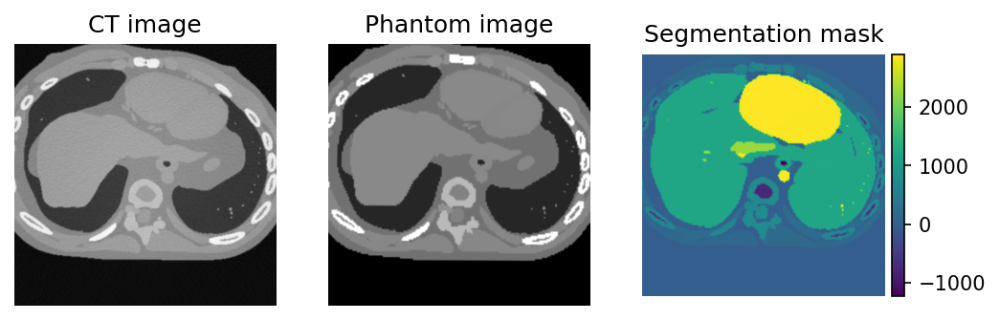

In [20]:
max_images = 5
count = 0
idx = 0
while count < max_images:
    patient = low_dose_ct_scans.iloc[idx]
    ct_image, ground_truth_transformed, seg_mask_transformed, lesion_mask_transformed = get_registered_ground_truths(patient)
    rmse = norm(ct_image, ground_truth_transformed)
    idx += 1
    if seg_mask_transformed is None:
        continue
    if rmse > 200:
        continue
    print(patient)
    print(f'{rmse:3.3f}')
    count += 1
    plot_patient_images(ct_image, ground_truth_transformed, seg_mask_transformed, lesion_mask_transformed)
    plt.show()

## Prepare Dataset

In [21]:
from make_dataset import make_dataset, ImageGetter

In [22]:
dataset_dir = Path('/projects01/didsr-aiml/brandon.nelson/XCAT_body/sample_dataset')
make_dataset(dataset_dir, summary, max_images=50, max_lesions=20)

writing dataset of 50 to: /projects01/didsr-aiml/brandon.nelson/XCAT_body/sample_dataset with subdirectories:
images
ground_truth
lesion_masks
segmentation_masks
...
images: 50, lesions: 11


In [23]:
getter = ImageGetter(dataset_dir)

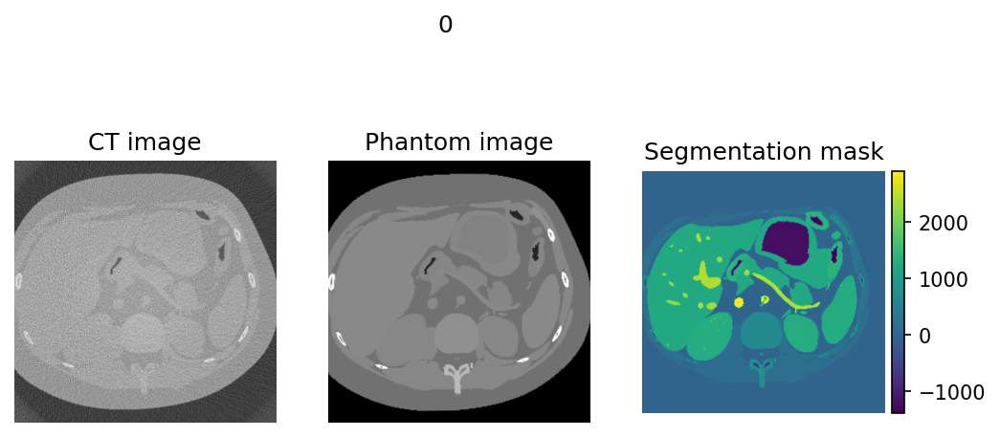

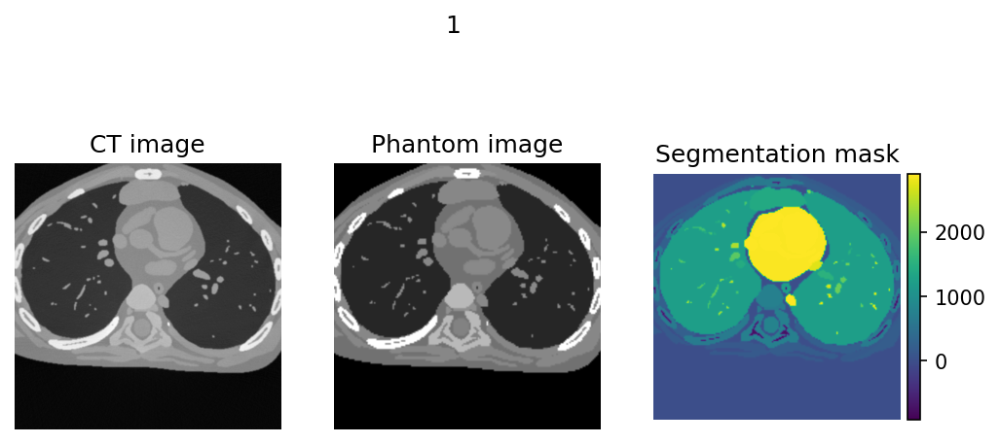

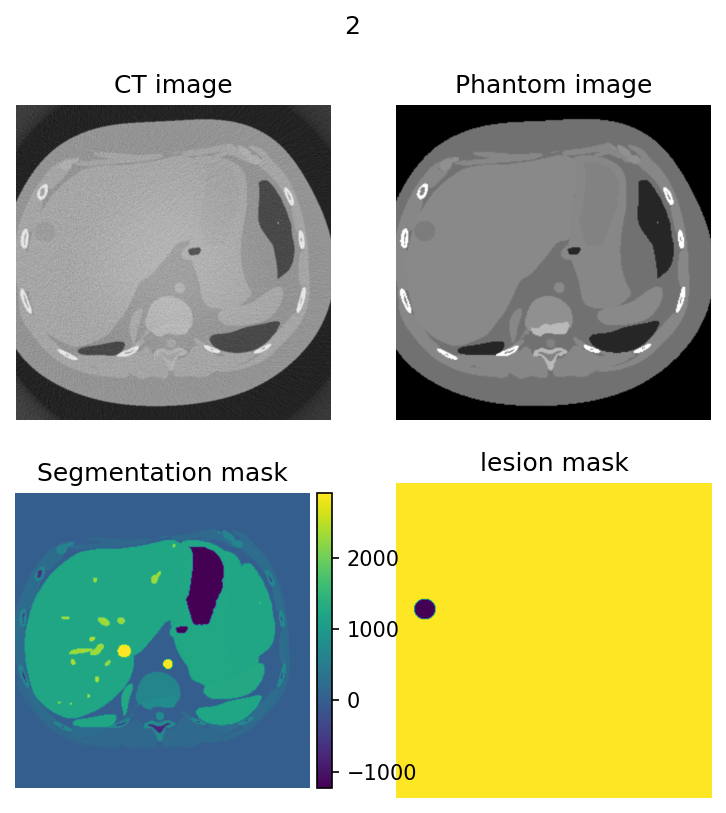

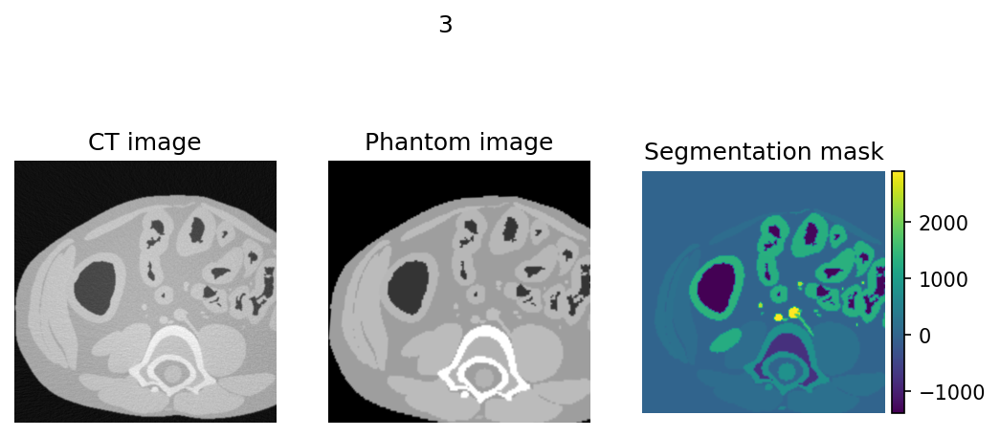

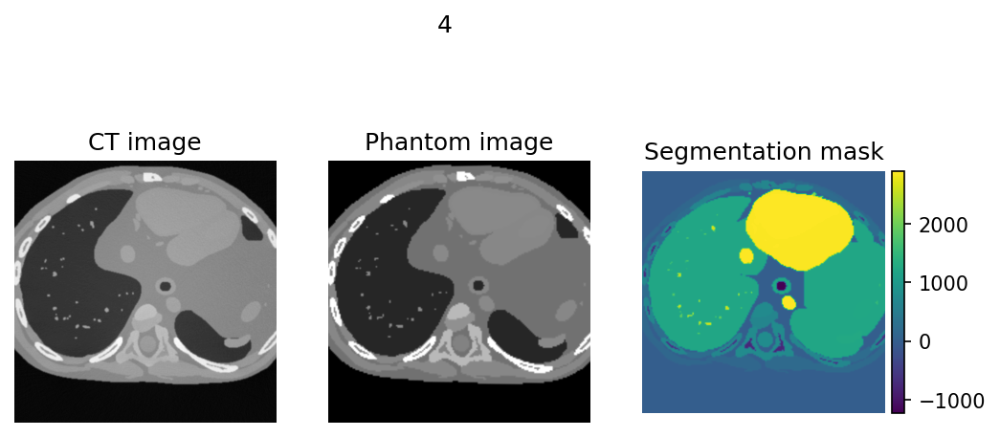

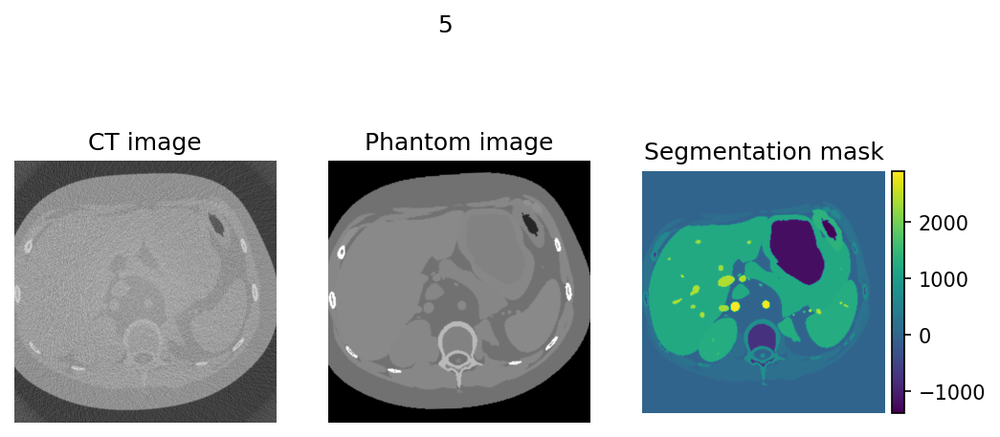

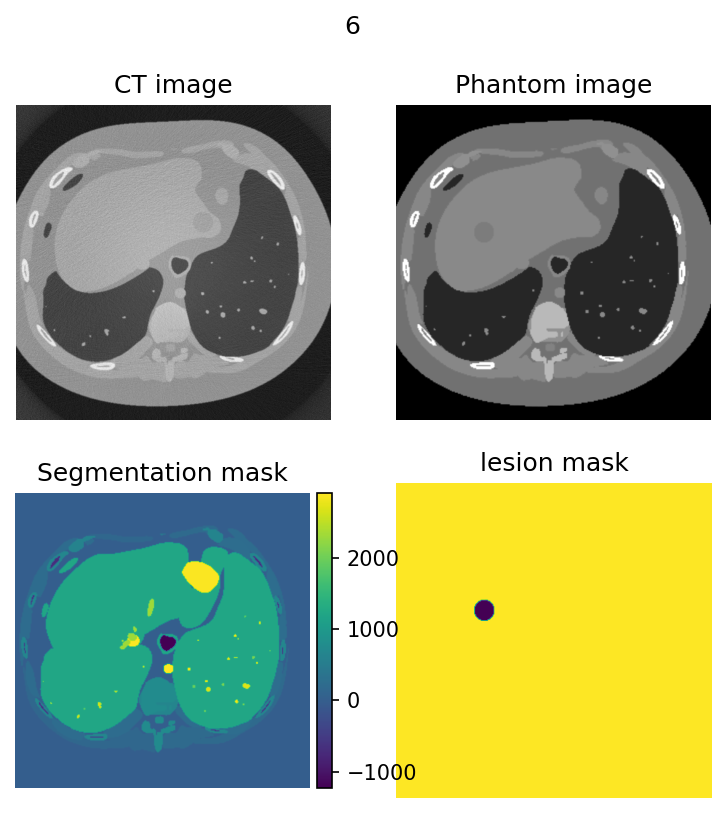

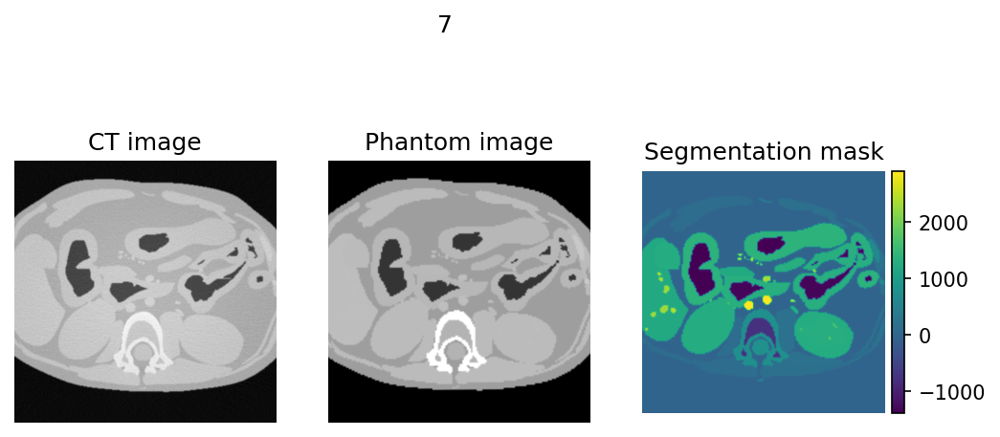

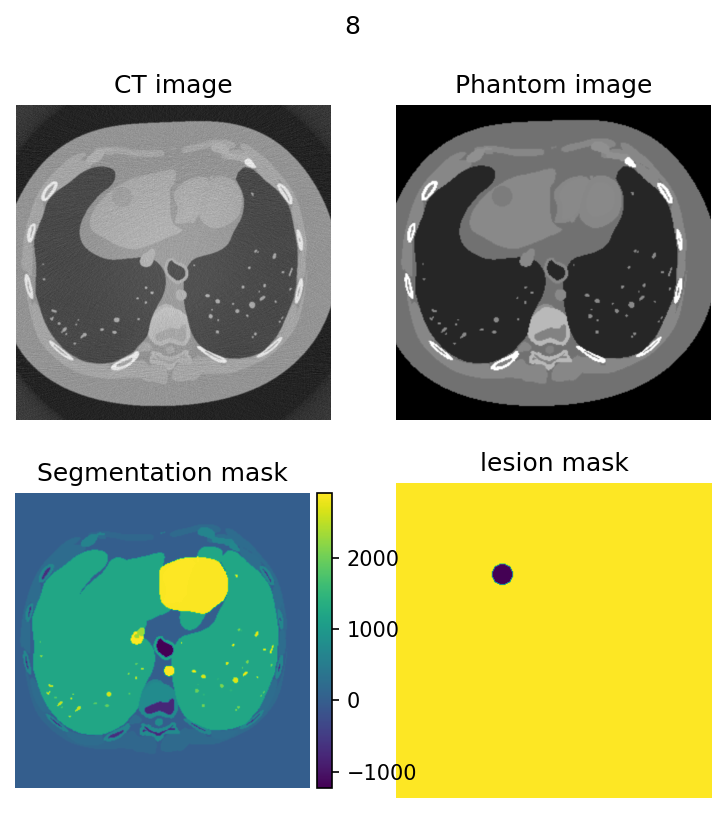

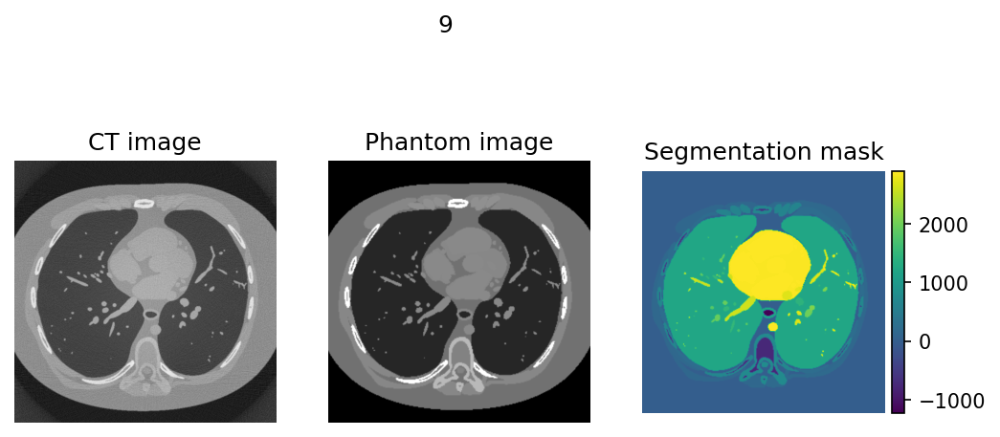

In [24]:
for i in range(10):
    ct_image, ground_truth, segmentation, lesion_mask = getter[i]
    plot_patient_images(ct_image, ground_truth, segmentation, lesion_mask)
    plt.suptitle(i)

## Conclusions

This virtual dataset offers complete control over scanner, patient, and lesion characteristics and can be used to design or evaluate AI applications ranging from denoising (x: CT image, y: phantom image), segmentation (x: CT image, y: Segmentation mask), CAD (x: CT image, y: lesion presence or mask), and more!

For any questions or ideas on how to further improve this tool or are interested in how to use it for your research please reach out! [brandon.nelson@fda.hhs.gov](mailto:brandon.nelson@fda.hhs.gov)